In [1]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt

from matplotlib.ticker import MultipleLocator
from matplotlib.gridspec import GridSpec
import matplotlib.animation as animation
from IPython.display import display

import warnings
warnings.filterwarnings("ignore")

from helperFunctions import *
setPlotStyle()


 # Visualising complex numbers

 ## Bode plots

 Okay, so we can describe systems in the frequency domain with these funky transfer functions, so what? Well, we still have some way to go before we can start doing useful stuff... I told you this was the part where it got messy.



 Just to be clear, we have a transfer function $G(s)$ that maps the complex plane to the complex plane, i.e.

 $$ G: \mathbb{C} \rightarrow \mathbb{C}.$$

 Then we have the steady state output being $Y(s) = G_{yu}(s)U(s)$, so for a given $s$, $Y(s)$ is the product of two complex numbers $G_{yu}(s)$ and $U(s)$. Remember for complex numbers: multiplication means multiplying the modulus/magnitude and adding the argument/angle/phase, i.e. $ae^{ci}\;be^{di} = abe^{(c+d)i}$. Likewise, division is division and subtraction, respectively, i.e. $\frac{ae^{ci}}{be^{di}} = \frac{a}{b}e^{(c-d)i}$. These two rules can be used to combine simple transfer function 'blocks' into more complicated functions. In any case, any input $U(s)$ will be amplified with $|G_{yu}(s)|$ and shifted with $\angle G_{yu}(s)$ to the output $Y(s)$, because they're multiplied.



 Now we want to visualise the behaviour of $G$, since that gives us a ton of information on that steady state input-output behaviour of the system. This can be done with *Bode* plots.

  **Important: Bode plots use the Fourier transform, so $s=i\omega$ !**



 So Bode follows the following rationale: $G$ maps the imaginary axis (pure sinusoids in time domain) to some other curve in the complex plane, not on the imaginary axis per se. Any complex number can be defined through their modulus/magnitude/gain and argument/angle/phase, so plotting these against the oscillation frequency, $\omega$, defines the curve in the complex plane. The gain is usually plotted on a log-log scale and the phase on a lin-log scale. Lets have a look at how that looks like for the simplest functions, $G = s^n$.

<IPython.core.display.Javascript object>

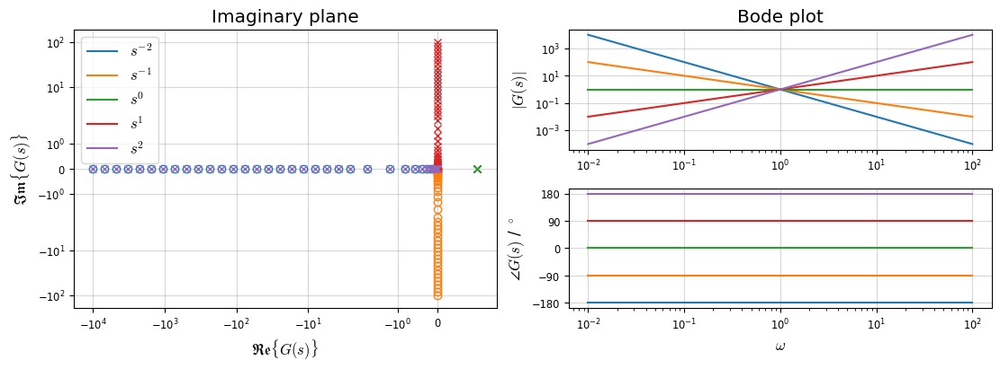

In [2]:
N = range(-2,3)
G1 = [lambda s, n=n : s**n for n in N]
OM = np.logspace(-2, 2)
S = OM*1j
G1_eval = [G(S) for G in G1]

### Plotting ###
fig = plt.figure(num="Bode plot intro")
gs = GridSpec(2,2, figure=fig)
ax = [fig.add_subplot(a) for a in [gs[:, 0], gs[0, 1], gs[1, 1]]]

[ax[0].plot(G_eval.real, G_eval.imag, 'x' if n >= 0 else 'o', c='none', mec=f"C{idx}") 
        for G_eval, n, idx in zip(G1_eval, N, range(len(N)))]
hnd = [ax[1].loglog(OM, np.abs(G_eval), label=f"$s^{"{"}{n}{"}"}$")[0] 
       for G_eval, n in zip(G1_eval, N)]
[ax[2].semilogx(OM, np.angle(G_eval, deg=True)) for G_eval in G1_eval]
ax[0].set(title="Imaginary plane", 
          xlabel="$\mathfrak{Re}\{G(s)\}$", ylabel="$\mathfrak{Im}\{G(s)\}$", 
          xscale='symlog', yscale='symlog')
ax[1].set(title="Bode plot", ylabel = "$|G(s)|$")
ax[2].set(xlabel = r"$\omega$", ylabel = r"$\angle G(s)$ / ${}^\circ$")
ax[2].yaxis.set_major_locator(MultipleLocator(90))
ax[0].legend(handles=hnd)
display(fig)


 What you should note in the plot above:

 - In the left plot the magnitude changes, but the phase is constant and how this translates to the Bode plot,

 - $s^0=1$ is constant and how that translates to the magnitude plot,

 - that in a log-log scale $s^n$, the magnitude is a line with slope $n$.

 <div style="text-align:center;background-color:tomato;">End of lecture "Bode Plots"</div>

 ## Nyquist plot and the Nyquist Criterion



 This exploration will be top-down and quite extensive, so we'll start with the definition and work our way down to the nitty gritty of why and how the criterion works.



 ### Definition

 Wikipedia gives this definition of the criterion:



 >Given a Nyquist contour $\Gamma_s$, let $P$ be the number of poles of $L(s)$ encircled by $\Gamma_s$, and $Z$ be the number of zeros of $1+L(s)$ encircled by $\Gamma_s$. Alternatively, and more importantly, if $Z$ is the number of poles of the closed loop system in the right half plane, and $P$ is the number of poles of the open-loop transfer function $L(s)$ in the right half plane, the resultant contour in the $L(s)$-plane, $\Gamma_{L(s)}$, shall encircle (clockwise) the point $(-1+j0)$ $N$ times such that $N = Z - P$.



 That's pretty overwhelming! Let's take it apart:

 - Nyquist contour $\Gamma_s$: this is defined as the clockwise contour encompassing the Right Half of the imaginary Plane (RHP). It is also the collection of all $s$ we'll consider.

 - $L(s)$: the loop transfer function; the product of the plant/process and controller transfer functions, we'll come back to this.

 - $P$: the number of RHP poles of $L(s)$.

 - $Z$: the number of RHP zeros of $1+L(s)$ **and** the number of RHP poles of the closed loop system.

 - $N$: the number of clockwise rotations around $-1+j0$ of $L(\Gamma_s)$, and $N=Z-P$.



 ### Stability

 So $Z$ is supposedly the number of unstable poles of the closed loop system. Then if $Z=0$, there are no RHP poles destabilizing the closed loop, so the closed loop is stable! Now we also got that $N=Z-P\rightarrow Z=N+P$, so we can just count the clockwise encirclements in the Nyquist plot $L(\Gamma_s)$ and add it to the number of RHP poles of $L(s)$ and if that's zero the closed loop is stable! Wait but something added to something should be zero? Good question, $N$ is positive for clockwise encirclements, but negative for counterclockwise encirclements. So, alternatively, we can say the closed loop is stable if (and only if) the **net** number of counterclockwise encirclements of $-1+j0$ is equal to the number of RHP poles of $L(s)$. This is our main use for the Nyquist criterion, because this is how we assess stability.



 ### Where do they get these transfer functions from?

 Another excellent question! This is where it gets a tad more difficult, but we'll soon look at some pictures too. First, we have a quick look at the closed loop transfer function again. Our block diagram with reference $r$, output error $e$, actuation $u$, output $y$, controller $C$, and process $G$ is



 ![](figures/CLsys.svg)



 Then in the frequency domain the transfer from the reference to the output is $\frac{Y(s)}{R(s)}$. We get this by following the chain as

 $$Y(s) = G(s)U(s) = G(s)C(s)E(s) = L(s)E(s) = L(s)(R(s)-Y(s))$$

 $$\rightarrow (1+L(s))Y(s) = L(s)R(s) \rightarrow \frac{Y(s)}{R(s)} = \frac{L(s)}{1+L(s)}.$$



 So we can conclude that zeros of $1+L(s)$ are poles of our closed loop system. We saw $1+L(s)$ before! *And they were talking about its zeros!!* In the Nyquist criterion, $Z$ was defined as "the number of zeros of $1+L(s)$ encircled by $\Gamma_s$" **and** "the number of poles of the closed loop system in the right half plane." We've now discovered why these are linked!



 ### Why encirclements then?

 This is where we start letting go of formal mathematics and start going more by visuals. If you're cool however, you can find out more about the formalities in [Cauchy's argument principle](https://en.wikipedia.org/wiki/Argument_principle). It'll take a couple of steps to arrive at the source of the encirclements, but no worries. We'll go through it step by step.



 ### First the contour

 We'll not go for the full Nyquist contour $\Gamma_s$ immediately, but first take a smaller contour $\Gamma$. Lets define that!

<IPython.core.display.Javascript object>

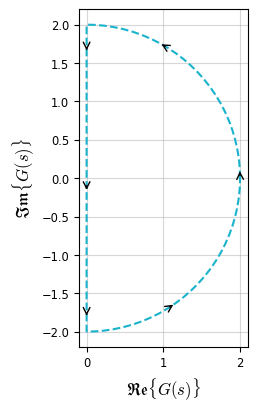

In [3]:
## Create contour
Q = np.linspace(start=0, stop=2*np.pi, num=100, endpoint=True)
R = 2
cntr = R * np.exp(1j * Q)
cntr[cntr.real < 0] = cntr[cntr.real < 0].imag * 1j

fig1, ax = plt.subplots()
drawContour(ax, cntr)

display(fig1)


 That's a nice semicircle of finite radius! In the end we want to 'walk along the contour' to get its mapping. So we have our complex variable $s$ for our transfer functions and this we'll walk along the contour. That looks like this:

In [4]:

fig1, ax = plt.subplots()
drawContour(ax, cntr)
sc = ax.scatter([cntr[0].real], [cntr[0].imag], marker='x', color='red')
ax.legend([r'$\Gamma$', r'$s$'])

def animFun(t): 
    sc.set_offsets([cntr[t].real, cntr[t].imag])
    return sc, 
anim = animation.FuncAnimation(fig1, func=animFun, frames=len(Q), interval=30, blit=True)

display(anim)


<IPython.core.display.Javascript object>

 ### Shuffling $L(s)$

 Next, we will demonstrate the origin of the encirclements. We need to rewrite $L(s)$ a little first though. For a Linear Time Invariant (LTI) system the loop function can be written as a fraction of two polynomials with the respective roots being the zeros and poles of the loop function. Many words, this is it in maths

 $$ L(s) = \frac{N_L(s)}{D_L(s)} $$

 and

 $$ 1+L(s) = \frac{N_L(s) + D_L(s)}{D_L(s)}.$$

 From this we can see that $L(s)$ and $1+L(s)$ share the same poles, which are the roots of $D_L(s)$.



 Suppose we call $1+L(s) = F(s)$ for now. We are interested in the zeros of $F(s)$, since these are our closed loop poles as we deduced before. Also we know that the sum of two polynomials is another polynomial, so we can write

 $$ F(s) = \frac{N_L(s) + D_L(s)}{D_L(s)} = \frac{N_F(s)}{D_F(s)}.$$

 The roots of $N_F(s)$ are therefore zeros of $F(s)$.



 ### Polynomials

 We'll quickly jump into polynomials for a second. Polynomials are largely defined by their roots. For example, this is what we do when we factorize a parabola formula to find its roots. Similar to that, we can write a polynomial $N_F(s)$ as the product of its $Z$ number of roots, $z_k$, as

 $$ N_F(s) = (s - z_1)(s-z_2)...(s-z_Z) = \prod_{k=1}^Z (s - z_k).$$

 Then we can also define $N_F^\dagger (s) = \prod_{k=2}^Z (s - z_k)$, such that

 $$N_F(s) = (s-z_1)N_F^\dagger (s).$$



 ### Inside or outside

 Now we're going to make two categories: zeros inside $\Gamma$ and zeros outside $\Gamma$. Let's say $z_1$ lies outside $\Gamma$ and look at the behaviour of *the phase of* $(s-z_1)$ when we walk $s$ along $\Gamma$.

In [5]:
from matplotlib.patches import Arc

def anim_init(z1, ax):
    for i in range(2):
        ax[i].scatter(np.real(z1), np.imag(z1), marker='o', facecolors='none', edgecolors='r', lw=1)
        ax[i].annotate("$z_1$", xy=(np.real(z1), np.imag(z1)),
                    xytext=(.5,.3), textcoords='offset fontsize', color='red')

    ## Animation time! Don't focus too much on this it's fine
    r = cntr - z1
    rm = np.max(np.abs(r))
    ax[1].set(aspect='equal', xlabel="$\mathfrak{Re}\{G(s)\}$", ylabel="$\mathfrak{Im}\{G(s)\}$", xlim=[-rm+np.real(z1), rm+np.real(z1)], ylim=[-rm+np.imag(z1),rm+np.imag(z1)])

    arr = [None,None]
    for i in range(2):
        arr[i] = ax[i].annotate("", xy=(np.real(cntr[0]), np.imag(cntr[0])), 
                    xytext=(np.real(z1), np.imag(z1)),
                    arrowprops=dict(arrowstyle="-|>", color='red'))

    phl1 = plt.plot([np.real(z1),rm/2+np.real(z1)], [np.imag(z1),np.imag(z1)], 'k', lw=1.2, alpha=0.3)
    phl2 = plt.plot([np.real(z1),np.real(z1)+np.real(rm/2*np.exp(1j*np.angle(r[0])))], 
                    [np.imag(z1),np.imag(z1)+np.imag(rm/2*np.exp(1j*np.angle(r[0])))], 'k', lw=1.2, alpha=0.3)
    phArc = Arc((np.real(z1),np.imag(z1)), width=rm/2.3, height=rm/2.3, theta2=np.angle(r[0], deg=True))
    ax[1].add_patch(phArc)
    return arr, phArc, phl2, r, rm

def animate(t):
    for i in range(2):
        arr[i].xy = (cntr[t].real, cntr[t].imag)
    phArc.theta2 = np.angle(r[t], deg=True)
    phl2[0].set_data([np.real(z1),np.real(z1)+np.real(rm/2*np.exp(1j*np.angle(r[t])))], 
                    [np.imag(z1),np.imag(z1)+np.imag(rm/2*np.exp(1j*np.angle(r[t])))])
    return arr[0], arr[1], phArc, phl2[0]

fig2, ax = plt.subplots(1, 2)
drawContour(ax[0], cntr)

## define the zero
z1 = 1.1*R*np.exp(9/7*np.pi*1j) # You can change me if you'd like

arr, phArc, phl2, r, rm = anim_init(z1, ax)
anim = animation.FuncAnimation(fig2, func=animate, frames=len(Q), interval=50, blit=True)

display(anim)



<IPython.core.display.Javascript object>

 Okay, that's looking cool! The angle doesn't seem to be changing all that much, but it's funny to look at I guess. Let's move that zero into $\Gamma$ now and see what happens.

In [6]:
fig3, ax = plt.subplots(1, 2)
drawContour(ax[0], cntr)

## define the zero
z1 = 0.8*R*np.exp(-2/7*np.pi*1j) # You can change me if you'd like

arr, phArc, phl2, r, rm = anim_init(z1, ax)
anim = animation.FuncAnimation(fig3, func=animate, frames=len(Q), interval=50, blit=True)

display(anim)


<IPython.core.display.Javascript object>

 *Wait...* was that a circle? Actually, that makes sense right? $\Gamma$ goes around $z_1$, so then it has to make a full circle. Woah okay, so $(s-z_1)$ makes a full rotation if (and yes, only if) $z_1$ is on the inside of $\Gamma$, otherwise it just oscilates.



 Cool, but this is only for one zero though? What about the others? Well, remember the polynomial

 $$ N_F(s) = \prod_{k=1}^Z (s - z_k)?$$

 It says here that $N_F(s)$ is the product of a bunch of complex numbers. We know what that means, adding the phases! So any zero inside $\Gamma$ adds a full clockwise encirclement to $N_F(\Gamma)$ (and also $F(\Gamma)$) around **the origin**. What do the outside zeros add though? There are two options: if the zero is real, it splits $\Gamma$ exactly in half and doesn't add any phase overall, if the zero is complex it does add some phase of course. However, complex zeros come in conjugate pairs, so these phase additions cancel out because they are mirrored over the real axis.



 How do poles behave here actually? Very similar really, but since the poles are in the denominator of $F(s)$, they subtract phase rather than add. So poles inside $\Gamma$ cause counterclockwise encirclements of the origin.



 ### I forgot what we were trying to figure out

 Yes, me too. Let's run it backwards. We know that zeros inside the contour add a full clockwise rotation and poles add a counterclockwise rotation. If we expand our finite $\Gamma$ to the infinite Nyquist contour $\Gamma_s$, this will encompass all right half plane (RHP) zeros and poles. So the number of clockwise encirclements of the origin of $F(\Gamma_s)$ equals the number of RHP zeros minus the RHP poles. That sounds very familiar! It's similar to the $N=Z-P$ equation, except that is shifted. Realise that

 $$F(\Gamma_s) = 1 + L(\Gamma_s),$$

 so encirclement of $0+j0$ by $F(\Gamma_s)$ means encirclement of $-1 + j0$ by $L(\Gamma_s)$.



 And that's nearly it! Looking back at the practically applicable Nyquist criterion:

 > The closed loop is stable if (and only if) the net number of counterclockwise encirclements of $-1+j0$ is equal to the number of RHP poles of $L(s)$.



 We're missing one last step. Since $L(s)$ and $F(s)$ share the same poles, and the number of counterclockwise encirclements of $-1+j0$ is equal to the number of these poles in the RHP, the number of CCW encirclements and the number of RHP poles of $L(s)$ from the criterion are only equal if there are no RHP zeros of $F(s)$ adding clockwise encirclements. Then, since there are no RHP zeros of $F(s)$, the closed loop is stable!



 And that is why Nyquist works in very rough strokes.



 ### What if I'm freaky and use positive feedback?

 Then the definition of $F(\Gamma_s) = 1 - L(\Gamma_s)$, so then $N$ is the number of encirclements around $1 + j0$. But why would you do that?

 ## Nyquist vs. Bode, epic rap battles of history



 We've seen both Bode plots and the Nyquist plot now. However, just a recap: Bode plots have $s=j\omega$ on the horizontal axes and on the two vertical axes is the magnitude and phase of the transfer function. We've also been looking at magnitude and phase with Nyquist so we must be able to relate the two! Lets look at a dummy loop transfer function

 $$L(s) = 150\cdot \frac{s(s-10)}{(s + 0.1)(s+50)^2}.$$

 (Determine the poles and zeros for yourself)



<IPython.core.display.Javascript object>

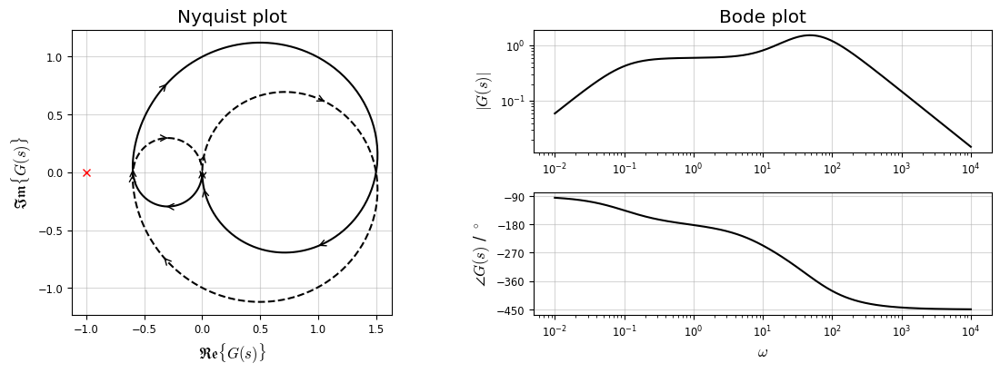

In [7]:
OM = np.logspace(-2, 4, 900)
S = OM*1j

L1 = lambda s :  150* s*(s - 1e1) / ((s + .1) * (s + 50)**2)
L1_eval1 = L1(S)
L1_eval2 = L1(np.flip(-S))

fig = plt.figure(num="Bode - Nyquist relation")
gs = GridSpec(2,2, figure=fig)
ax = [fig.add_subplot(a) for a in [gs[:, 0], gs[0, 1], gs[1, 1]]]

ax[0].set(title="Nyquist plot", 
          xlabel="$\mathfrak{Re}\{G(s)\}$", ylabel="$\mathfrak{Im}\{G(s)\}$")
ax[1].set(title="Bode plot", ylabel = "$|G(s)|$")
ax[2].set(xlabel = r"$\omega$", ylabel = r"$\angle G(s)$ / ${}^\circ$")
ax[2].yaxis.set_major_locator(MultipleLocator(90))

drawContour(ax[0], L1_eval1, c='k', ls='-')
drawContour(ax[0], L1_eval2, c='k', ls='--')
ax[0].plot([-1], [0], 'xr')
ax[1].loglog(OM, np.abs(L1_eval1), 'k')
ax[2].semilogx(OM, unwrap_angle(np.angle(L1_eval1, deg=True)), 'k')
display(fig)


 Now **this**, this is something we can animate🌈

In [8]:
# OM = np.logspace(-2, 5, 50)
# S = OM*1j

L1_eval1 = L1(S)
L1_eval2 = L1(np.flip(-S))

L1_eval = np.append(L1_eval1, L1_eval2)
OM_full = np.append(OM, np.flip(-OM))

ang1, ang2, ang = unwrap_angle(np.angle(L1_eval1, deg=True)), unwrap_angle(np.angle(L1_eval2, deg=True)), unwrap_angle(np.angle(L1_eval, deg=True))

ax[2].cla()
ax[2].set(xlabel = r"$\omega$", ylabel = r"$\angle G(s)$ / ${}^\circ$")
ax[2].semilogx(np.abs(OM_full)[:OM_full.size//2], ang[:OM_full.size//2], 'k')
ax[2].semilogx(np.abs(OM_full)[OM_full.size//2:], ang[OM_full.size//2:], 'k--')

arr = ax[0].annotate("", xy=(L1_eval[0].real, L1_eval[0].imag), 
                    xytext=(0, 0),
                    arrowprops=dict(arrowstyle="-|>", color='red'))
magL, = ax[1].plot([OM_full[0], OM_full[0]],
                  [np.abs(L1_eval).min(), np.abs(L1_eval[0])],
                  'rx-')
angL, = ax[2].plot([OM_full[0], OM_full[0]],
                  [0, ang1[0]],
                  'rx-')

ss = np.arange(0, OM_full.size, step= OM_full.size//50, dtype=int)
def animate(t):
    t = ss[t]
    arr.xy = (L1_eval[t].real, L1_eval[t].imag)
    magL.set_data([abs(OM_full[t]), abs(OM_full[t])],
                  [np.abs(L1_eval).min(), np.abs(L1_eval[t])])
    angL.set_data([abs(OM_full[t]), abs(OM_full[t])],
                  [0, ang[t]])
    return arr, magL, angL

anim = animation.FuncAnimation(fig, func=animate, frames=50, interval=150, blit=True)

display(anim)


 Note the relation between the two plots!